<a href="https://colab.research.google.com/github/priya1315/3104_Team18/blob/main/FollowYourPose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



#Follow Your Pose:
# Pose-Guided Text-to-Video Generation using Pose-Free Videos


In [ ]:
#@markdown Check type of GPU and VRAM available.
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

Tesla T4, 15360 MiB, 15101 MiB


In [ ]:
#@title Installing python version 3.8
!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils

#Install Environment
This step sets up a personalized workspace for the task of this project.

In [ ]:
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.8 2
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.9 1
!python --version
!apt-get update
!apt install software-properties-common
!sudo dpkg --remove --force-remove-reinstreq python3-pip python3-setuptools python3-wheel
!apt-get install python3-pip

print('Git clone project and install requirements...')
!git clone https://github.com/mayuelala/FollowYourPose.git

In [ ]:
!cd /content/FollowYourPose
!export PYTHONPATH=/content/FollowYourPose:$PYTHONPATH
# %pip install -r requirements.txt
!python3.8 -m pip install -q -U --pre triton
!apt update
!python3.8 -m pip install -q diffusers==0.11.1 torch==1.13.1 transformers==4.26.0 bitsandbytes==0.35.4 \
imageio-ffmpeg xformers==0.0.16  --extra-index-url https://download.pytorch.org/whl/cu113



In [ ]:
%cd /content/FollowYourPose/
!python3.8 -m pip install -r requirements.txt
!pip install MoviePy

# Weight
This step clones the Followyourpose framework.

URL Ref: https://follow-your-pose.github.io/

In [ ]:
%rm -rf /content/FollowYourPose/checkpoints
%mkdir checkpoints
!git lfs install
!git clone https://huggingface.co/YueMafighting/FollowYourPose_v1
%mv /content/FollowYourPose/FollowYourPose_v1/* /content/FollowYourPose/checkpoints/
%rm -rf FollowYourPose_v1

Updated git hooks.
Git LFS initialized.
Cloning into 'FollowYourPose_v1'...
remote: Enumerating objects: 42, done.
remote: Total 42 (delta 0), reused 0 (delta 0), pack-reused 42
Unpacking objects: 100% (42/42), 584.62 KiB | 2.04 MiB/s, done.
Filtering content: 100% (9/9), 9.75 GiB | 39.53 MiB/s, done.


# Setup
1. Storing videos into subfolders
2. Choose specific file to load from Charades folder
3. Watch playback of the video in 512x512 size

In [ ]:
#@title Initialize variables
video_path = ""
video_full_path = ""
resized_video_full_path = ""
skeleton_path = ""

Choose Video from the data file so that we can load the video data

## Storing input videos into subfloders so that we can find the videos easily based on their types

* There are 3 files, Charades, youtube and sample
* The video for charades are downloaded through google drive

In [ ]:
#[GAI - 5, Team18-6]
import os
import gdown

charades_dir = "/content/FollowYourPose/data/charades"
youtube_dir = "/content/FollowYourPose/data/youtube"
sample_dir = "/content/FollowYourPose/data/sample"

# Create the destination directory if it doesn't exist
os.makedirs(charades_dir, exist_ok=True)
os.makedirs(youtube_dir, exist_ok=True)
os.makedirs(sample_dir, exist_ok=True)

charades_urls = [  # Charades video download links
    "https://drive.google.com/uc?export=download&id=1qSGw4ABiClXqILD-u0MxR_YM8QT6Zsxs 0CFQV.mp4",
    "https://drive.google.com/uc?export=download&id=1Mls_wdXl2MvkRSEkpW04Lc321zT55XXL 0NVG2.mp4",
    "https://drive.google.com/uc?export=download&id=1U_khY997N6SX3maXBFH9VYB7cI7KCjnm 0NN7I.mp4",
    "https://drive.google.com/uc?export=download&id=1aqGru3-SG94RixVE9LwFru0p_Fow3Jyp 0M9ZO.mp4",
    "https://drive.google.com/uc?export=download&id=1tWC8k-BOE0mmjYyRj4Vxm9Dsjn5vITu4 0M6IY.mp4",
    "https://drive.google.com/uc?export=download&id=1K6yx5eZHqsoDIDsMXT1eswC-A3tmwmVM 0JXN3.mp4",
    "https://drive.google.com/uc?export=download&id=1F4s6b-IV_BWHfknNHcqMmLTUuZE-Z39Q 0IFCL.mp4",
    "https://drive.google.com/uc?export=download&id=1ACmgo-WDUSY0LFhI4kQsit3iqmnC4atp 0GH5O.mp4",
    "https://drive.google.com/uc?export=download&id=1UuNswRV8wc7nSbs2W9JmesymC2zXVgk6 0DJ6R.mp4",
    "https://drive.google.com/uc?export=download&id=19jn1Agvzdj7PbwTF8ZB6k-VUYw63nm57 0CX32.mp4"
]

youtube_urls = [
    # Add YouTube video download links here
]

sample_urls = [
    # Add sample video download links here
]

# Function to check if a file already exists
def file_exists(file_path):
    return os.path.isfile(file_path)

# Download Charades files
for url_with_name in charades_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(charades_dir, original_name)
    if file_exists(file_name):
        print(f"Charades file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded Charades file: {original_name}")

# Download YouTube videos
for url_with_name in youtube_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(youtube_dir, original_name)
    if file_exists(file_name):
        print(f"YouTube file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded YouTube file: {original_name}")

# Download sample videos
for url_with_name in sample_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(sample_dir, original_name)
    if file_exists(file_name):
        print(f"Sample file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded Sample file: {original_name}")

print("All files downloaded successfully.")

Downloading...
From: https://drive.google.com/uc?export=download&id=1qSGw4ABiClXqILD-u0MxR_YM8QT6Zsxs
To: /content/FollowYourPose/data/charades/0CFQV.mp4
100%|██████████| 1.88M/1.88M [00:00<00:00, 146MB/s]


Downloaded Charades file: 0CFQV.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1Mls_wdXl2MvkRSEkpW04Lc321zT55XXL
To: /content/FollowYourPose/data/charades/0NVG2.mp4
100%|██████████| 1.08M/1.08M [00:00<00:00, 142MB/s]


Downloaded Charades file: 0NVG2.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1U_khY997N6SX3maXBFH9VYB7cI7KCjnm
To: /content/FollowYourPose/data/charades/0NN7I.mp4
100%|██████████| 1.29M/1.29M [00:00<00:00, 128MB/s]


Downloaded Charades file: 0NN7I.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1aqGru3-SG94RixVE9LwFru0p_Fow3Jyp
To: /content/FollowYourPose/data/charades/0M9ZO.mp4
100%|██████████| 2.16M/2.16M [00:00<00:00, 86.7MB/s]


Downloaded Charades file: 0M9ZO.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1tWC8k-BOE0mmjYyRj4Vxm9Dsjn5vITu4
To: /content/FollowYourPose/data/charades/0M6IY.mp4
100%|██████████| 1.91M/1.91M [00:00<00:00, 61.5MB/s]


Downloaded Charades file: 0M6IY.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1K6yx5eZHqsoDIDsMXT1eswC-A3tmwmVM
To: /content/FollowYourPose/data/charades/0JXN3.mp4
100%|██████████| 2.44M/2.44M [00:00<00:00, 126MB/s]


Downloaded Charades file: 0JXN3.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1F4s6b-IV_BWHfknNHcqMmLTUuZE-Z39Q
To: /content/FollowYourPose/data/charades/0IFCL.mp4
100%|██████████| 2.54M/2.54M [00:00<00:00, 131MB/s]


Downloaded Charades file: 0IFCL.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1ACmgo-WDUSY0LFhI4kQsit3iqmnC4atp
To: /content/FollowYourPose/data/charades/0GH5O.mp4
100%|██████████| 1.92M/1.92M [00:00<00:00, 141MB/s]


Downloaded Charades file: 0GH5O.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1UuNswRV8wc7nSbs2W9JmesymC2zXVgk6
To: /content/FollowYourPose/data/charades/0DJ6R.mp4
100%|██████████| 890k/890k [00:00<00:00, 73.9MB/s]


Downloaded Charades file: 0DJ6R.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=19jn1Agvzdj7PbwTF8ZB6k-VUYw63nm57
To: /content/FollowYourPose/data/charades/0CX32.mp4
100%|██████████| 989k/989k [00:00<00:00, 112MB/s]

Downloaded Charades file: 0CX32.mp4
All files downloaded successfully.


# Choose video files from Charades project

In [ ]:
# [GAI - 6, Team18-7]
# @title Choose specific video file to load

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]

# Initialize dropdowns for choosing folder
folder_dropdown = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
video_dropdown = widgets.Dropdown(description='▶️:', layout=Layout(width='50%')) # initially empty

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

def update_video_dropdown(selected_folder):
    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isfile(os.path.join(video_path, selected_folder, i))]
    video_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    video_dropdown.disabled = len(files) == 0
    video_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

def folder_dropdown_handler(change):
    selected_folder = change.new
    update_video_dropdown(selected_folder)
folder_dropdown.observe(folder_dropdown_handler, names='value')


initial_selected_folder = folder_dropdown.value
update_video_dropdown(initial_selected_folder)

# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Choose a video from the selected folder'), video_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)


def video_dropdown_handler(change):
    global chosen_video_dropdown_input
    global video_full_path
    chosen_video_dropdown_input = change.new
    print('\r', 'Chosen video:', chosen_video_dropdown_input, end='')
    video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value)
video_dropdown.observe(video_dropdown_handler, names='value')

Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

 Chosen video: 0NVG2.mp4

# Show selected video from dropdown
The selected video will be shown in 512x512 size

In [ ]:
#[GAI - 7] -- Watch video playback
#[GAI - 35] -- Crop videos to 512x512
#@title Watch video playback, crop video to 512x512

from moviepy.editor import VideoFileClip
import os

if video_full_path == "":
  video_full_path = VideoFileClip(os.path.join(video_path, folder_dropdown.value, video_dropdown.value))

clip = VideoFileClip(video_full_path)

orig_width, orig_height = clip.size
if orig_width > orig_height:
  margin_size = round((orig_width - orig_height) / 2)
  square_clip = clip.margin(top=margin_size, bottom=margin_size)
elif orig_width < orig_height:
  margin_size = round((orig_height - orig_width) / 2)
  square_clip = clip.margin(left=margin_size, right=margin_size)
else:
  square_clip = clip

resized_clip = square_clip.resize(width=512)

#saving the resized clip in a permanent location
resized_clip.write_videofile(video_full_path.split(".")[0] + "_resized.mp4")
resized_video_full_path = video_full_path.split(".")[0] + "_resized.mp4"

resized_clip.ipython_display()

Moviepy - Building video /content/FollowYourPose/data/charades/0NVG2_resized.mp4.
MoviePy - Writing audio in 0NVG2_resizedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /content/FollowYourPose/data/charades/0NVG2_resized.mp4



t: 100%|█████████▉| 724/726 [00:11<00:00, 106.00it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/0NVG2.mp4, 388800 bytes wanted but 0 bytes read,at frame 725/726, at time 30.21/30.23 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready /content/FollowYourPose/data/charades/0NVG2_resized.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# Inference

Loading Pre-trained model and adjusting clip timings so that I can customize the clip's duration

Recommended value = 8

Due to memory of GPU, we recommend set video_length=8 in ./config/pose_sample.yaml for running successfully.

Meanwhile, we should keep the skeleton frame length(./followyourpose/pipelines/pipeline_followyourpose.py:422 ) equal with video_length

In [ ]:
# @title Step 1: Install Needed Libraries for mmpose (Part 1)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils
# Set Python 3.8 as the default
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.8 1
# Check Python version
!python3 --version
# Update system packages
!sudo apt update
!apt-get install python3-pip
# Check pip version for Python 3.8
!python3.8 -m pip --version

# Install PyTorch and related libraries for CUDA version 11.1 (cu117)
!pip install torch==2.0.0+cu117 torchvision==0.15.1+cu117 --index-url https://download.pytorch.org/whl/cu117


In [ ]:
# Step 1.2: Install Needed Libraries for mmpose (Part 2)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

# Install OpenMMLab's OpenMIM
!pip install -U openmim

# Install the MMEngine package using OpenMIM
!mim install mmengine

# Install mmcv package (a dependency) with a minimum version of 2.0.0
!mim install "mmcv>=2.0.0"

# Install mmdet package (a dependency) with a minimum version of 3.1.0 using OpenMIM
!mim install "mmdet>=3.1.0"

In [ ]:
# Step 1.3: Install Needed Libraries for mmpose (Part 3)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

#Change directory to keep mmpose
%cd /content/FollowYourPose

# Clone the mmpose repository from GitHub
!git clone https://github.com/open-mmlab/mmpose.git

# Change the working directory to the cloned mmpose repository
%cd mmpose

# Install the requirements specified in the repository's requirements.txt
!pip install -r requirements.txt

# Install mmpose as an editable package in your environment
!pip install -v -e .

# Install mmpose package (a dependency) with a minimum version of 1.1.0
!mim install "mmpose>=1.1.0"

In [ ]:
# Step 1.4: Install Needed Libraries for mmpose (Part 4)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

# Install opencv-python-headless package
!pip install opencv-python-headless

# Install bitsandbytes
!pip install --upgrade bitsandbytes

In [ ]:
#[GAI - 9] - Choose video files from Charades project
!pip install ipywidgets

In [ ]:
#[GAI - 9, TEAM18-10] - Choose video files from Charades project
# @title Step 2:  Choose video files from Charades project

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

video_path = os.path.join(os.getcwd(),'/content/FollowYourPose/data/charades')

#get all videos into a list
files = [i for i in os.listdir(video_path) if os.path.isfile(os.path.join(video_path, i))]

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

#dropdown initialization with filenames
video_dropdown_input = 'Dropdown_input'
video_dropdown = widgets.Dropdown(description='▶️:',options=(files), layout=Layout(width='50%'))
# Handling of dropdown if no videos in selected folder
video_dropdown.disabled = len(files) == 0
video_dropdown.options = [f'No videos available in charades folder'] if len(files) == 0 else files

def dropdown_handler(change):
    global video_dropdown_input
    global video_full_path
    print('\r','Chosen video: ' + str(change.new),end='')
    video_dropdown_input = change.new
    video_full_path = os.path.join(video_path, video_dropdown.value)
video_dropdown.observe(dropdown_handler, names='value')

#form items -- label and dropdown
form_items = [
    Box([Label(value='Choose a video from the Charades project folder'),
         video_dropdown], layout=form_item_layout)]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)

Box(children=(Box(children=(Label(value='Choose a video from the Charades project folder'), Dropdown(descripti…

 Chosen video: 759MY.mp4

In [ ]:
#[GAI-4, TEAM18-9]
#[GAI-8, TEAM18-9]
#[GAI-22, TEAM18-9]
# @title Step 3:  Select Model that is going to be used for inference and set the video length to 8 or lesser

import ipywidgets as widgets
from ipywidgets import HBox, Label
from ipywidgets import Layout, Button, Box, FloatText, Textarea, Dropdown, Label, IntSlider
import time
import pandas as pd
import os
from IPython.display import display

path = os.path.join(os.getcwd(), '/content/FollowYourPose/checkpoints/')

folder_names = [name for name in os.listdir(path) if os.path.isdir(os.path.join(path, name)) and name != "followyourpose_checkpoint-1000"]

# Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)
folder_names.insert(0, "")

# IntText widget
video_length_widget = widgets.IntText(
    value=0,
    layout=Layout(width='50%')  # Adjust the width as needed
)

# Dropdown widget
folder_dropdown = widgets.Dropdown(
    options=folder_names,
    layout=Layout(width='50%')  # Adjust the width as needed
)


# Event handler for dropdown
def inttext_handler(change):
    global video_length
    print('\r','Chosen video length: ' + str(change.new), end='')
    video_length = change.new

video_length_widget.observe(inttext_handler, names='value')

# Event handler for dropdown
def dropdown_handler(change):
    global drop_down_input
    print('\r','Chosen pre-trained model: ' + str(change.new), end='')
    drop_down_input = change.new

folder_dropdown.observe(dropdown_handler, names='value')

# Button
button = widgets.Button(description="Generate")

# Event handler for button click
def on_button_click(b):
    video_length = video_length_widget.value
    if drop_down_input == "Dropdown_input_1":
        print("\n Please choose a file")
    else:
        file_path = open("/content/FollowYourPose/configs/pose_sample.yaml", "r")
        with open("/content/FollowYourPose/configs/pose_sample.yaml", "r") as file:
            lines = file.readlines()
        if lines:
            # Modify the first line (assuming you want to replace it)
            new_first_line = 'pretrained_model_path: "./checkpoints/' + drop_down_input + '"\n'
            new_tenth_line = '  video_length: ' + str(video_length) + '\n'
            lines[0] = new_first_line
            lines[9] = new_tenth_line
            # Open the file in write mode to save the modified content
            with open("/content/FollowYourPose/configs/pose_sample.yaml", "w") as file:
                file.writelines(lines)
            print("\nLine has been changed")

# Link the function to the button
button.on_click(on_button_click)

# Form items
form_items = [
    Box([Label(value='Choose a Pre-trained Model'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Enter Video Length(in seconds)'), video_length_widget], layout=form_item_layout)  # Added IntText widget
]

# Create the form
form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='100%',
    padding='1%'
))

# Display the form and button
display(form)
display(button)


Box(children=(Box(children=(Label(value='Choose a Pre-trained Model'), Dropdown(layout=Layout(width='50%'), op…

Button(description='Generate', style=ButtonStyle())

 Chosen video length: 8
Line has been changed


After selecting pretrained model and setting video length, Choose where you would like to save the video to.

In [ ]:
# @title Step 4: Edit prompts
# @markdown Click the dropdown to select the config file the model will be using.
# @markdown To edit prompts, simply change the text.
# @markdown The program will save your changes automatically.

# Team18-12

import os
import ipywidgets as widgets
from IPython.display import clear_output
import yaml

selected_config_file_name = 'pose_sample.yaml' # default file/ needed for 1st run

# To fix the yaml saving indents improperly hehe
class IndentDumper(yaml.Dumper):
    def increase_indent(self, flow=False, indentless=False):
        return super(IndentDumper, self).increase_indent(flow, False)

# Assigning prompts from yaml
config_path = os.path.join(os.getcwd(), '/content/FollowYourPose/configs')

# Function to load prompts from selected YAML file
def load_prompts_from_file(file_name):
    with open(os.path.join(config_path, file_name)) as f:
        config = yaml.safe_load(f)
    return config['validation_data']['prompts']

# Dropdown widget to select YAML file
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml')]
yaml_dropdown = widgets.Dropdown(options=yaml_files, value=selected_config_file_name,description='Config File📮')

# Event handler for dropdown change
def handle_yaml_change(change):
    global prompts, selected_config_file_name
    selected_config_file_name = change.new
    prompts = load_prompts_from_file(change.new)
    reset_cell_display()

yaml_dropdown.observe(handle_yaml_change, names='value')
tags_container = widgets.VBox() # Container for all widgets

# Creating widgets for each prompt
def initialize_widgets(prompts):
    global text_widgets, delete_buttons
    text_widgets = [widgets.Text(value=prompt, description='Prompt {}'.format(i + 1)) for i, prompt in enumerate(prompts)]
    delete_buttons = [widgets.Button(description='Delete', layout=widgets.Layout(width='70px')) for _ in text_widgets]
    for i, delete_button in enumerate(delete_buttons):
        delete_button.on_click(lambda event, index=i: handle_delete(event, index))
    for index, text_widget in enumerate(text_widgets):
        text_widget.observe(lambda change, index=index: handle_text_change(change, index), names='value')

new_prompt_widget = widgets.Text(description='New Prompt:', placeholder='Enter a new prompt...')
add_prompt_button = widgets.Button(description='Add Prompt') # Add prompt btn

def add_prompt(sender):
    new_prompt = new_prompt_widget.value.strip()
    if new_prompt:
        new_text_widget = widgets.Text(value=new_prompt, description='Prompt {}'.format(len(text_widgets) + 1))
        text_widgets.append(new_text_widget)
        delete_button = widgets.Button(description='Delete', layout=widgets.Layout(width='70px'))
        delete_buttons.append(delete_button)
        new_text_widget.observe(lambda change, index=len(text_widgets)-1: handle_text_change(change, index), names='value')
        delete_button.on_click(lambda event, index=len(text_widgets)-1: handle_delete(event, index))

        # Add the new prompt to .yaml config
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'].append(new_prompt)
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    new_prompt_widget.value = ''
    update_tags_container()

add_prompt_button.on_click(add_prompt) # onCLick event

# Update display of prompts
def update_tags_container():
    tags_container.children = [yaml_dropdown] + [widgets.HBox([text_widget, delete_button]) for text_widget, delete_button in zip(text_widgets, delete_buttons)] + [new_prompt_widget, add_prompt_button]


def handle_text_change(change, index):
    # If textfield change, write to file
    if change['type'] == 'change':
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'][index] = change['new'].strip()
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    # If textfield empty, delete
    if not change['new'].strip():
        handle_delete(None, index)

def handle_delete(event, index):
    with open(os.path.join(config_path, selected_config_file_name)) as f:
        config = yaml.safe_load(f)
    del config['validation_data']['prompts'][index]
    with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
        yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)
    reset_cell_display()            # Refresh cell display

def reset_cell_display():
    prompts = load_prompts_from_file(selected_config_file_name)
    clear_output()              # Clear cell display of
    initialize_widgets(prompts) # Re-initialize widgets
    update_tags_container()     # Update tags container
    display(tags_container)     # Display the tags container

reset_cell_display()            # Refresh cell display


### Step 5: Creation of Skeleton Video

In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Skeleton Video using mmpose
from IPython.display import HTML, display, Video, clear_output
from ipywidgets import widgets, Output, interactive
import ipywidgets as widgets
from ipywidgets import HBox
import os
import time
import subprocess
import yaml

# Choosen pre-trained model
file_path = '/content/FollowYourPose/configs/pose_sample.yaml'
with open(file_path, 'r') as file:
    config = yaml.safe_load(file)
current_pretrained_model_path = config.get('pretrained_model_path', '')

# Choose Video
clip_path = os.path.join('/content/FollowYourPose/data/charades', video_dropdown.value)
video_filename = os.path.splitext(os.path.basename(clip_path))[0]  # Remove ".mp4" extension
filepath_name = os.path.splitext(os.path.basename(current_pretrained_model_path))[0]  # Remove ".mp4" extension

print('Current pretrained_model path:', filepath_name)
print('Current video:', video_filename)
print("This will take about 1-5mins...")
print("\n")

#dropdown to select video format
video_format = widgets.Dropdown(
    options=["Black Background", "Skeleton Superimposed"],
    description="Select format:"
)

# Inference function

def inference(selected_format):
    vis_out_dir = "skeleton_output/Visualization"  # Visualization output directory
    os.makedirs(vis_out_dir, exist_ok=True)

    if selected_format == "Black Background":
        !python demo/inferencer_demo.py \
            "{clip_path}" \
            --pose2d human --vis-out-dir "{vis_out_dir}"  --black-background

        # Define the expected output video path
        expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'  # Replace with the actual path

        if os.path.exists(expected_output_video_path):
            clear_output(wait=True)
            print(f"Video saved to Path: {vis_out_dir}.")
        else:
            print("\nError, try re-installing needed libraries again (Step 1.2 & Step 1.3)")

    elif selected_format == "Skeleton Superimposed":
        !python demo/inferencer_demo.py \
            "{clip_path}" \
            --pose2d human --vis-out-dir "{vis_out_dir}"
        clear_output(wait=True)
        # Define the expected output video path
        expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}_superimposed.mp4'  # Replace with the actual path

        if os.path.exists(expected_output_video_path):
            clear_output(wait=True)
            print(f"Video saved to Path: {vis_out_dir}.")
        else:
            print("\nError, try re-installing needed libraries again (Step 1.2 & Step 1.3)")



# Button widget to trigger inference
inference_button = widgets.Button(description="Run Inference")

# Define a function to handle button click
def on_inference_button_click(b):
    selected_format = video_format.value
    inference(selected_format)

# Attach the button click event handler
inference_button.on_click(on_inference_button_click)

# Display widgets
display(HBox([video_format, inference_button]))


Current pretrained_model path: stable-diffusion-v1-4
Current video: 0NVG2
This will take about 1-5mins...




In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Video Player Selector
from moviepy.editor import VideoFileClip, clips_array

# Define the source video folder and visualization folder paths
source_folder = '/content/FollowYourPose/data/charades'
visualization_folder = '/content/FollowYourPose/mmpose/skeleton_output/Visualization'

# Initialize the paths as global variables
original_path = ""
skeleton_path = ""

# Function to get a list of video files in a folder
def get_video_files(folder):
    if os.path.exists(folder) and os.path.isdir(folder):
        video_files = [f for f in os.listdir(folder) if f.endswith('.mp4')]
        return video_files
    else:
        return []

# Create a dropdown for selecting the source video
source_video_dropdown = widgets.Dropdown(
    options=get_video_files(source_folder),
    description='Select Original Video:'
)

# Create a dropdown for selecting the visualization video
visualization_video_dropdown = widgets.Dropdown(
    options=get_video_files(visualization_folder),
    description='Select Skeleton Video:'
)

def Save_Option(change):
  global original_path  # Use the global keyword to modify the global variable
  global skeleton_path
  original_path = os.path.join(source_folder,source_video_dropdown.value)
  skeleton_path = os.path.join(visualization_folder,visualization_video_dropdown.value)
  print("Saved Option")

# Create a button to play the videos
play_button = widgets.Button(description="Save Option")
play_button.on_click(Save_Option)

# Display the widgets
print("Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.")
display(source_video_dropdown)
display(visualization_video_dropdown)
display(play_button)

Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.


Dropdown(description='Select Original Video:', options=('0M9ZO.mp4', '0NVG2.mp4', '0NN7I.mp4', '0CX32.mp4', '0…

Dropdown(description='Select Skeleton Video:', options=(), value=None)

Button(description='Save Option', style=ButtonStyle())

In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Video Player for inference Original vs Skeleton comparison
from moviepy.editor import VideoFileClip, clips_array

print(f"\nOriginal Video Path is {original_path}")
print(f"Skeleton Video Path is {skeleton_path}")

# Load the two video clips
video1 = VideoFileClip(original_path)
video2 = VideoFileClip(skeleton_path)

# Resize the video clips
video1 = video1.resize(width=300)
video2 = video2.resize(width=300)

# Create an overlay by placing video2 on the right of video1
final_video = clips_array([[video1, video2]])

# Display the overlay video
final_video.ipython_display()



Original Video Path is /content/FollowYourPose/data/charades/759MY.mp4
Skeleton Video Path is /content/FollowYourPose/mmpose/skeleton_output/Visualization/759MY.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



t:  96%|█████████▋| 326/338 [00:02<00:00, 135.11it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/759MY.mp4, 388800 bytes wanted but 0 bytes read,at frame 337/338, at time 20.25/20.30 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Step 6: Skeleton to Inference Video

In [ ]:
# GAI-11b [Team18-63] Display Video & Caption
# @title Install Upgrades
!pip install --upgrade accelerate
!pip install --upgrade xformers

In [ ]:
# [GAI - 26, Team18-19]
# @title Choose Location where videos are outputted to


#@markdown Please provide the name of the directory where the video should be saved.
OUTPUT_DIR = "/content/FollowYourPose/Inference" #@param {type:"string" }

# Changing save_path in txt2video.py
path = os.path.join(os.getcwd(), '/content/FollowYourPose/txt2video.py')

a_file = open(path, "r")
list_of_lines = a_file.readlines()
start_index_171 = list_of_lines[171 -1].find('"') + 1
end_index_171 = list_of_lines[171 -1].rfind('"')

start_index_174 = list_of_lines[174 -1].find('"') + 1
end_index_174 = list_of_lines[174 -1].rfind('"')

# Line 171 OG: 6tabs save_videos_grid(sample, f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}/{prompt}.gif")
list_of_lines[171 -1] = list_of_lines[171 -1][:start_index_171] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}/{{prompt}}.gif" + list_of_lines[171 -1][end_index_171:]

# Line 174 OG: 4tabs save_path = f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}.gif"
list_of_lines[174 -1] = list_of_lines[174 -1][:start_index_174] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}.gif" + list_of_lines[174 -1][end_index_174:]

a_file = open("/content/FollowYourPose/txt2video.py", "w")
a_file.writelines(list_of_lines)
a_file.close()

print(f"[*] Videos will be saved at {OUTPUT_DIR}/...")
!mkdir -p $OUTPUT_DIR


[*] Videos will be saved at /content/FollowYourPose/mmpose/output/samples/...


In [ ]:
# GAI 11A [TEAM18-14] - inference
# GAI-11b [Team18-63] Display Video & Caption
# @title Run FollowYourPose
%cd /content/FollowYourPose
!pwd
!TORCH_DISTRIBUTED_DEBUG=DETAIL accelerate launch txt2video.py --config="configs/pose_sample.yaml"  --skeleton_path="{skeleton_path}"

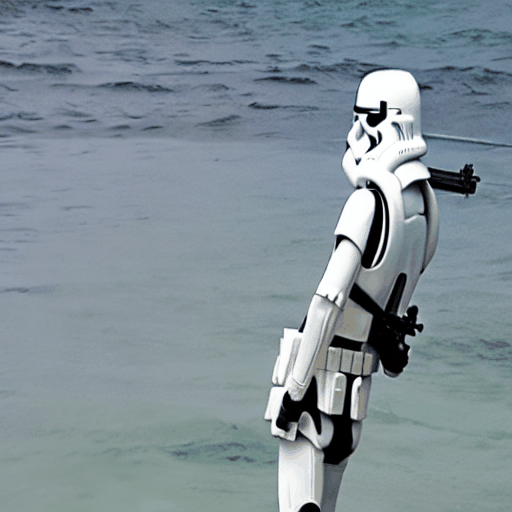

In [ ]:
# @title Play the Video output with caption
# GAI-11b [Team18-63] Display Video & Caption
import os
from IPython.display import Image, display, Markdown

# From GAI-26
search_directory = OUTPUT_DIR

def display_gif_with_caption(gif_path, caption):
    html_code = f'''
    <div style="text-align: left;">
        <p style="font-weight: bold; margin: 10px 0; padding-left:20px">{caption}</p>
        <br>
    </div>
    '''
    display(HTML(html_code))

# Search for GIF files in the directory and its subdirectories
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith('.gif') and not file.lower().startswith('sample'):
            # Construct the full path to the GIF file
            gif_path = os.path.join(root, file)
            # Extract the file name from the path and remove the file extension
            gif_caption = os.path.splitext(file)[0]
            # Display the GIF
            display(Image(filename=gif_path, width=200))
            # Display the Caption
            display_gif_with_caption(gif_path, gif_caption)


In [ ]:
# @title Running MMPose on GIF to generate superimpose skeleton on resultant GIF
# [TEAM18-75] GAI-39

import subprocess

# From GAI-26
search_directory = OUTPUT_DIR

# Define the expected output video path
expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Superimposed/{video_filename}.mp4'

# Search for GIF files in the directory and its subdirectories
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith('.gif') and not file.lower().startswith('sample'):
            # Construct the full path to the GIF file
            gif_path = os.path.join(root, file)
            video_filename = os.path.splitext(os.path.basename(gif_path))[0]  # Remove ".gif" extension
            # Construct the output video path
            output_video_path = f"/content/FollowYourPose/Inference/convertmp4/{video_filename}.mp4"
            os.makedirs(os.path.dirname(output_video_path), exist_ok=True)  # Ensure the parent directory exists
            # Run FFmpeg to convert the GIF to a video
            cmd = ["ffmpeg", "-i", gif_path, output_video_path]
            subprocess.run(cmd)
            print(f"GIF converted to mp4 and saved at: {output_video_path}")

# Inference for Skeleton Superimposed format
vis_out_dir = "/content/FollowYourPose/mmpose/skeleton_output/Superimposed/"  # Visualization output directory
os.makedirs(vis_out_dir, exist_ok=True)

# Run Inference for Skeleton Superimposed format
!python demo/inferencer_demo.py \
    "{output_video_path}" \
    --pose2d human --vis-out-dir "{vis_out_dir}"


if os.path.exists(expected_output_video_path):
    clear_output(wait=True)
    print(f"Result video with SuperImposed skeleton from mmpose has been saved to Path: {vis_out_dir}.")
else:
    print("\nError, try re-installing needed libraries again (Step 1)")


Result video with SuperImposed skeleton from mmpose has been saved to Path: /content/FollowYourPose/mmpose/skeleton_output/Superimposed/.


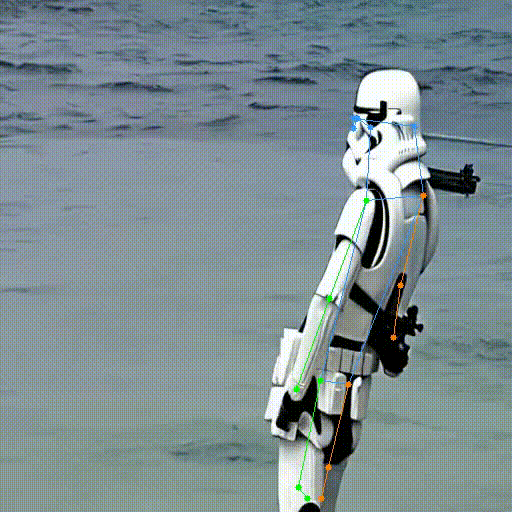

In [ ]:
# @title Display Superimposed Skeleton on Resultant Video
# [TEAM18-75] GAI-39

import os
import subprocess
from IPython.display import Image, display, HTML

# Define the input directory with MP4 files
input_directory = '/content/FollowYourPose/mmpose/skeleton_output/Superimposed'
# Define the output directory for GIF files
output_directory = '/content/FollowYourPose/mmpose/skeleton_output/Superimposed_GIF'

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

def convert_mp4_to_gif(input_mp4, output_gif):
    cmd = ["ffmpeg", "-i", input_mp4, output_gif]
    subprocess.run(cmd)

def display_gif_with_caption(caption):
    html_code = f'''
    <div style="text-align: left;">
        <p style="font-weight: bold; margin: 10px 0; padding-left:20px">{caption}</p>
        <br>
    </div>
    '''
    display(HTML(html_code))

# Search for MP4 files in the input directory and convert them to GIF
for root, dirs, files in os.walk(input_directory):
    for file in files:
        if file.lower().endswith('.mp4') and not file.lower().startswith('sample'):
            mp4_path = os.path.join(root, file)
            gif_filename = os.path.splitext(file)[0] + '.gif'
            gif_path = os.path.join(output_directory, gif_filename)

            # Convert MP4 to GIF
            convert_mp4_to_gif(mp4_path, gif_path)

            #Display The Gif
            display(Image(filename=gif_path, width=200))

            # Display the caption
            gif_caption = os.path.splitext(file)[0]
            display_gif_with_caption(gif_caption)


# Training

In [ ]:
# @title Step 1: Save model to the model file
#[GAI - 14 , TEAM 18 - 27]
#[GAI - 19 , TEAM 18 - 32]

import os
import ipywidgets as widgets

# Create directories if they don't exist
os.makedirs("/content/FollowYourPose/model", exist_ok=True)

# Define the save folder
save_folder = "/content/FollowYourPose/model"

# Create a text widget for entering the model name
model_name_widget = widgets.Text(description='Model Name:', placeholder='Enter model name...')
display(model_name_widget)  # Display the widget to the user

# Function to handle the model name submission
def save_model(sender):
    model_name = model_name_widget.value  # Get the entered model name

    # Ensure the file name has a ".txt" extension
    if not model_name.endswith(".txt"):
        model_name += ".txt"

    # Check if the model name is already in use
    if os.path.exists(os.path.join(save_folder, model_name)):
        print(f"The model name '{model_name}' is already in use. Please enter a unique name.")
    else:
        # Specify the file content you want to save
        file_content = "This is the content of the file."

        # Create the full path to the file in the selected folder
        file_path = os.path.join(save_folder, model_name)

        try:
            with open(file_path, "w") as file:
                file.write(file_content)
            print(f"File '{model_name}' has been saved in '{save_folder}'.")
        except Exception as e:
            print(f"An error occurred: {e}")

# Add an event handler for the button click
save_button = widgets.Button(description="Save Model")
save_button.on_click(save_model)
display(save_button)


Text(value='', description='Model Name:', placeholder='Enter model name...')

Button(description='Save Model', style=ButtonStyle())

The model name 'model1.txt' is already in use. Please enter a unique name.


## Creating a file to store pretrained model
- Creates a timestamped config file under models folder, obtained by copying pose_train.yaml and then changing the relevant fields
- Trimming to 8 seconds for the video selected in the earlier dropdown
- Finetuning process for the video selected



##Creating CSV file for training purposes

In [ ]:
import csv

# Sample data
data = [
    {"part_id": "1", "clip_id": "0CFQV.mp4", "caption": "A person walking to their wardrobe and opening it and then looks into the mirror."},
    {"part_id": "1", "clip_id": "0CX32.mp4", "caption": "A person runs into the living room, carrying a towel and a broom. The person walks over to the window and opens it."},
    {"part_id": "1", "clip_id":"0DJ6R.mp4" , "caption": "A person opens a desk drawer and takes something out. The person goes to leave, but pauses in the doorway."},
     {"part_id": "1", "clip_id": "0GH5O.mp4", "caption": "A person grabs a towel as they are leaving the house, and walk through the doorway smiling."},
     {"part_id": "1", "clip_id": "0IFCL.mp4", "caption": "A person closes the door and starts tidying the shelf.  Then they start leaving."},
     {"part_id": "1", "clip_id": "0JXN3.mp4", "caption": "A person is tidying their living room when they begin to sneeze. Their friend brings this person medicine from the shelf."},
     {"part_id": "1", "clip_id": "0M6IY.mp4", "caption": "Person sweeps the floor with a broom.   Person the puts the broom away. Person takes a nap on the sofa and awakens after hearing a noise.  Person answers the phone."},
     {"part_id": "1", "clip_id": "0M9ZO.mp4", "caption": "Person takes off shoes and starts making a sandwich in the kitchen.  Person begins smiling after finishing sandwich, and then starts tidying up the counter."},
     {"part_id": "1", "clip_id": "0NN7I.mp4", "caption": "Person is throwing a towel towards a pillow and putting a book away."},
     {"part_id": "1", "clip_id": "0NVG2.mp4", "caption": "A person sits on the bed and takes their shoes off. The person then begins to eat and drink the food that is on the side table."},
]

# Define the CSV file name
folder_path = "/content/FollowYourPose/data/charades/"

csv_file = "caption_rm2048_train.csv"
# Create the full file path by joining the path and the file name
csv_file_path = folder_path + csv_file


# Write the data to the CSV file
with open(csv_file_path, mode="w", newline="") as file:
    fieldnames = ["part_id", "clip_id", "caption"]
    writer = csv.DictWriter(file, fieldnames=fieldnames)

    # Write the header
    writer.writeheader()

    # Write the data rows
    for row in data:
        writer.writerow(row)

print(f"CSV file '{csv_file}' has been created.{csv_file_path}")


CSV file 'caption_rm2048_train.csv' has been created./content/FollowYourPose/data/charades/caption_rm2048_train.csv


In [ ]:
#@title Copying pose_train.yaml and inputting video_path
import yaml
from datetime import datetime

if video_path == "/content/FollowYourPose/data/charades":
  video_full_path = os.path.join(video_path, video_dropdown.value.split(".")[0] + "_resized.mp4")
elif video_path == "/content/FollowYourPose/data":
  video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value.split(".")[0] + "_resized.mp4")

with open('/content/FollowYourPose/configs/pose_train.yaml', 'r') as file:
  new_config_file = yaml.safe_load(file)

localcurrentdateandtime = datetime.now()
replaced = str(localcurrentdateandtime).replace(" ", "-")

#making directory for hdvila
os.makedirs("/content/FollowYourPose/data/charades/part_1/", exist_ok=True)

#reducing video to 8 seconds
#copying the 8 second video into part_1/video_clips/video.mp4
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
ffmpeg_extract_subclip(video_full_path, 0, 8, targetname=f"/content/FollowYourPose/data/charades/part_1/{video_dropdown.value}")

#checking if model already exists
#if yes, change pretrained_model_path to the model
for folder in os.listdir("/content/FollowYourPose/checkpoints"):
  if model_name_widget.value in folder:
    new_config_file["pretrained_model_path"] = os.path.join("/content/FollowYourPose/checkpoints", folder)

#changing video path to the one in video_dropdown
new_config_file["train_data"]["video_path"] = f"/content/FollowYourPose/data/charades/part_1/{video_dropdown.value}"
new_config_file["validation_data"]["video_length"] = 8
new_config_file["max_train_steps"] = 100
new_config_file["checkpointing_steps"] = 50
new_config_file["validation_steps"] = 100
new_config_file["train_data"]["n_sample_frames"] = 8
new_config_file["gradient_checkpointing"] = True
new_config_file["validation_data"]["prompts"] = ["A Iron man on the beach"]
new_config_file["output_dir"] = f"output/{video_dropdown.value}-{replaced}"
if skeleton_path == "":
  new_config_file["skeleton_path"] = "./pose_example/vis_ikun_pose2.mov"
else:
  new_config_file["skeleton_path"] = skeleton_path


new_config_filepath = f'/content/FollowYourPose/model/{model_name_widget.value}_{video_dropdown.value.split(".")[0]}_{replaced}.yaml'

with open(new_config_filepath, 'w') as file:
    yaml.dump(new_config_file, file, sort_keys=False)

print(open(new_config_filepath).read())

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
pretrained_model_path: /content/FollowYourPose/checkpoints/model1-0NVG2.mp4-2023-10-22-07:31:02.165902
output_dir: output/0NVG2.mp4-2023-10-22-08:43:34.976675
train_data:
  video_path: /content/FollowYourPose/data/charades/part_1/0NVG2.mp4
  prompt: None
  n_sample_frames: 8
  width: 512
  height: 512
  sample_start_idx: 0
  sample_frame_rate: 4
  dataset_set: train
validation_data:
  prompts:
  - A Iron man on the beach
  video_length: 8
  width: 512
  height: 512
  num_inference_steps: 50
  guidance_scale: 12.5
  use_inv_latent: false
  num_inv_steps: 50
  dataset_set: val
learning_rate: 3e-5
train_batch_size: 1
max_train_steps: 100
checkpointing_steps: 50
validation_steps: 100
trainable_modules:
- attn1.to_q
- attn2.to_q
- attn_temp
- conv_temporal
skeleton_path: ./pose_example/vis_ikun_pose2.mov
seed: 33
mixed_precision: 'no'
use_8bit_adam: false
gradient_checkpointing: true
enable_xformers_memory_efficient_attent

In [ ]:
#@title Training process from the yaml file created above
#remember to change the checkpoint_steps to 500?
#pose_train.yaml must change the video_length to 8 and change the skeleton_path
#copy paste the new HDvila file to the one here and do so for the rest of the txt file in the github as well
#create ur own csv file. Msg priya if u want the csv file(if lazy)
#data/charades/part_1/video_1.mp4 (create this path so the csv will work)
#!accelerate launch train_followyourpose.py --config=CONFIG_NAME

%cd /content/FollowYourPose


# !accelerate launch train_followyourpose.py --config="configs/pose_train.yaml"
import os
import yaml
import ipywidgets as widgets
import subprocess
from IPython.display import Javascript, HTML, display, clear_output

import torch
torch.backends.cuda.split_kernel_apply_limit = 128

command = f"accelerate launch train_followyourpose.py --config={new_config_filepath} --skeleton_path=/content/FollowYourPose/data/charades/part_1/Video_1.mp4"
process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, universal_newlines=True)
base_path = os.path.join(os.getcwd(), '/content/FollowYourPose/')
#config_path = command.split('--config=')[1].split()[0]
config_path = command.split('--config=')[1].split(" --skeleton_path")[0]

# Function to load prompts from selected YAML file
def count_prompts_from_file():
    with open(os.path.join(base_path, config_path)) as f:
        config = yaml.safe_load(f)
        prompts = config['validation_data']['prompts']
    return len(prompts)

# Get the number of prompts from the YAML file
num_prompts = count_prompts_from_file()
num_max_total_progress = ((num_prompts + 1)*100) + 50

# Progress bars
total_progress_widget = widgets.IntProgress(min=0, max=num_max_total_progress, description='Total Progress:', style={'description_width': 'initial'})
general_progress_widget = widgets.IntProgress(min=0, max=100, description='Initialization:', style={'description_width': 'initial'})
individual_prompt_widgets = []  # List to store individual prompt progress bars

# Create individual progress bars for each prompt
for i in range(num_prompts):
    prompt_progress_widget = widgets.IntProgress(min=0, max=100, description=f'Prompt {i + 1}\'s progress:', style={'description_width': 'initial'})
    individual_prompt_widgets.append(prompt_progress_widget)

# Display the progress bars
display(total_progress_widget)
display(general_progress_widget)
for widget in individual_prompt_widgets:
    display(widget)


# DEBUGGING THINGS MAYBE
output_widget = widgets.Output(layout={'border': '1px solid black', 'max_height': '200px', 'overflow_y': 'auto'})
display(output_widget)  # Display the output widget


individual_progress_sum = 0
def update_total_progress():
    individual_progress_sum = sum(widget.value for widget in individual_prompt_widgets)
    num_total_progress = general_progress_widget.value + individual_progress_sum
    total_progress_widget.value = num_total_progress

global prompt_index, finish_line_counter
prompt_index = -2
finish_line_counter = 0
def update_progress(output):
    parts = output.strip().split() # Split each line by space into parts

    if len(parts) >= 3:
        global finish_line_counter
        if "subprocess.CalledProcessError" in output:
            total_progress_widget.value = num_max_total_progress
            total_progress_widget.bar_style = 'danger'

        # Initialization progress
        if parts[1].find('%') != -1:
            percentage = int(parts[1][:parts[1].find('%')])  # Extract the percentage, removing the '%' sign
            general_progress_widget.value = percentage
            update_total_progress()

            if general_progress_widget.value == 100:
                general_progress_widget.bar_style = 'success'

        # Individual prompt progress
        elif parts[0].find('%') != -1:
            global prompt_index
            if int(parts[0][:parts[0].find('%')]) == 0:
                prompt_index += 1
            prompt_percentage = int(parts[0][:parts[0].find('%')])
            individual_prompt_widgets[prompt_index].value = prompt_percentage
            update_total_progress()

            if individual_prompt_widgets[prompt_index].value == 100:
                individual_prompt_widgets[prompt_index].bar_style = 'success'

        elif parts[0] == 'Configuration':
            total_progress_widget.value += 10
            finish_line_counter += 1

    # Finishing messages
    if finish_line_counter == 4:
        total_progress_widget.value = num_max_total_progress
        total_progress_widget.bar_style = 'success'

    # DEBUGGING THINGS
    with output_widget:
        # clear_output(wait=True) # if using this, remove the max-height from output widget
        print(output, end="")  # print output as it is

# Process output logss
for line in iter(process.stdout.readline, ''):
    update_progress(line)

# Wait for the process to complete
process.communicate()

/content/FollowYourPose


IntProgress(value=0, description='Total Progress:', max=250, style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description='Initialization:', style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

('', None)

In [ ]:
# @title Step 2: Choose a dataset subfolder from the data folder to use for the training
# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]


# Initialize dropdowns for choosing folder
folder_dropdown_dataset = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
choosenfolder_dropdown = widgets.Dropdown( options ="",description='📂:', layout=Layout(width='50%')) # initially empty


#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)



def folder_dropdown_dataset_handler(change):
    global selected_folder
    selected_folder = change.new
    update_video_dropdown(change.new)
folder_dropdown_dataset.observe(folder_dropdown_dataset_handler, names='value')

def update_video_dropdown(selected_folder):

    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isdir(os.path.join(video_path, selected_folder, i))]
    choosenfolder_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    choosenfolder_dropdown.disabled = len(files) == 0
    choosenfolder_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown_dataset], layout=form_item_layout),
    Box([Label(value='Choose a folder from the selected folder'), choosenfolder_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)

def choosenfolder_dropdown_handler(change):
    global chosen_folder_dropdown_input
    chosen_folder_dropdown_input = change.new
choosenfolder_dropdown.observe(choosenfolder_dropdown_handler, names='value')




Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

In [ ]:
full_path = os.path.join(video_path,folder_dropdown_dataset.value,choosenfolder_dropdown.value)

## Cycling through each video in the folder to do the Training step on multiple videos consecutively

* The videos are taken from the full_file path
* It goes through a for loop and get the output of each input
* the output is later saved in the output file with unique file names

In [ ]:
#looping through videos

#new_path = os.path.join(full_path,"video_clips")
#removed the video_clips as i found it better, to change the file type change the hdvila file, which can be found in github
from datetime import datetime

videos = [i for i in os.listdir(full_path) if os.path.isfile(os.path.join(full_path, i))]
print(videos)

for clips in videos:
  localcurrentdateandtime = datetime.now()
  file_path = open("/content/FollowYourPose/configs/pose_train.yaml", "r")
  with open("/content/FollowYourPose/configs/pose_train.yaml", "r") as file:
    lines = file.readlines()
    if lines:
      # Modify the first line (assuming you want to replace it)
      new_output_line =  'output_dir: "output/'+ clips+'-'+str(localcurrentdateandtime).replace(" ", "-")+ '"\n'
    lines[1] = new_output_line
    with open("/content/FollowYourPose/configs/pose_train.yaml", "w") as file:
      file.writelines(lines)

  video_path = os.path.join(full_path,clips)
  !accelerate launch train_followyourpose.py --config="configs/pose_train.yaml" --skeleton_path=skeleton_path
  print(clips,"is done")



['Video_1.mp4']
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
A matching Triton is not available, some optimizations will not be enabled.
Error caught was: module 'triton.language' has no attribute 'constexpr'
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is

In [ ]:
#import shutil
#shutil.rmtree("/content/FollowYourPose/output")

In [ ]:
import os
import shutil

output_file = "/content/FollowYourPose/output/" + model_name_widget.value
checkpoint_path = "/content/FollowYourPose/checkpoints"

# Find all the subdirectories in the source directory
model_files = [d for d in os.listdir(output_file) if os.path.isdir(os.path.join(output_file, d))]

# Filter the subdirectories for those containing "Video" in their names
video_directories = [d for d in model_files if ".mp4" in d]

if video_directories:
    # Sort the "Video" directories by modification time to get the latest one
    latest_video_dir = max(video_directories, key=lambda d: os.path.getmtime(os.path.join(output_file, d)))

    # Check if the new folder was created after the "Video" folder in the checkpoint path
    latest_video_creation_time = os.path.getctime(os.path.join(output_file, latest_video_dir))
    existing_video_in_checkpoint_path = None

    for folder in os.listdir(checkpoint_path):
        if model_name_widget.value in folder and latest_video_dir.split("-")[0] in folder:
            existing_video_in_checkpoint_path = os.path.join(checkpoint_path, folder)
            break

    if existing_video_in_checkpoint_path:
        existing_video_creation_time = os.path.getctime(existing_video_in_checkpoint_path)
        if latest_video_creation_time > existing_video_creation_time:
            # Delete the existing "Video" folder in the checkpoint path and copy the new "Video" folder
            shutil.rmtree(existing_video_in_checkpoint_path)
            shutil.move(os.path.join(output_file, latest_video_dir), os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir))
            print("The current 'Video' folder was created before the current version, and it has been updated in the checkpoint path.")
        else:
            print("The 'Video' folder in the checkpoint path was created after the current version.")
    else:
        # Copy the new "Video" folder to the checkpoint path
        shutil.move(os.path.join(output_file, latest_video_dir), os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir))
        print("The 'Video' folder has been copied to the checkpoint path.")












The 'Video' folder has been copied to the checkpoint path.


##Testing

In [ ]:
# GAI-21
# @title Choose a dataset subfolder from the data folder to use for testing
# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]


# Initialize dropdowns for choosing folder
folder_dropdown_dataset = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
choosenfolder_dropdown = widgets.Dropdown( options ="",description='📂:', layout=Layout(width='50%')) # initially empty


#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)



def folder_dropdown_dataset_handler(change):
    global selected_folder
    selected_folder = change.new
    update_video_dropdown(change.new)
folder_dropdown_dataset.observe(folder_dropdown_dataset_handler, names='value')

def update_video_dropdown(selected_folder):

    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isdir(os.path.join(video_path, selected_folder, i))]
    choosenfolder_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    choosenfolder_dropdown.disabled = len(files) == 0
    choosenfolder_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

#initial_selected_folder = folder_dropdown_dataset.value
#update_video_dropdown(initial_selected_folder)


# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown_dataset], layout=form_item_layout),
    Box([Label(value='Choose a folder from the selected folder'), choosenfolder_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)

def choosenfolder_dropdown_handler(change):
    global chosen_folder_dropdown_input
    chosen_folder_dropdown_input = change.new
choosenfolder_dropdown.observe(choosenfolder_dropdown_handler, names='value')




# References
**Followyourpose Framework**: https://github.com/mayuelala/FollowYourPose

> Used as the basis of this entire notebook

**MMpose**: https://github.com/open-mmlab/mim

> Used to create the skeleton video

**ipywidgets**: https://ipywidgets.readthedocs.io/en/7.x/examples/Widget%20List.html


> Used to display all the interactable elements in this notebook


